In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob

In [2]:
#Reading the images
image1 = cv2.imread('..\\Applications\\Images\\1985.png')
image2 = cv2.imread('..\\Applications\\Images\\1993.png')
image3 = cv2.imread('..\\Applications\\Images\\2001.png')
image4 = cv2.imread('..\\Applications\\Images\\2011.png')

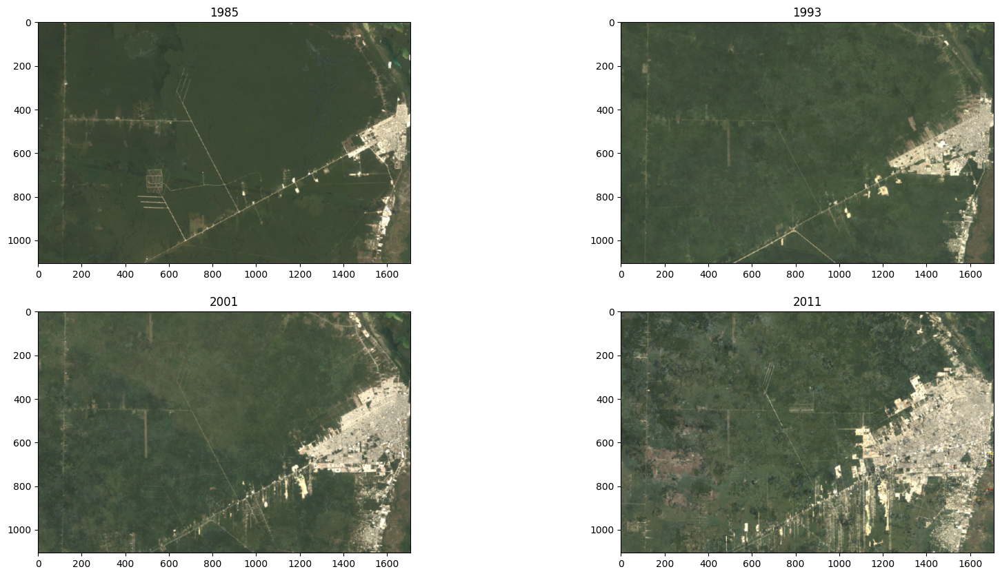

In [3]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(221)
ax.set_title('1985')
plt.imshow(image1[:,:,::-1])

ax = fig.add_subplot(222)
ax.set_title('1993')
plt.imshow(image2[:,:,::-1])

ax = fig.add_subplot(223)
ax.set_title('2001')
plt.imshow(image3[:,:,::-1])

ax = fig.add_subplot(224)
ax.set_title('2011')
plt.imshow(image4[:,:,::-1])

plt.show()

In [4]:
b1,g1,r1 = cv2.split(image1)
b4,g4,r4 = cv2.split(image4)

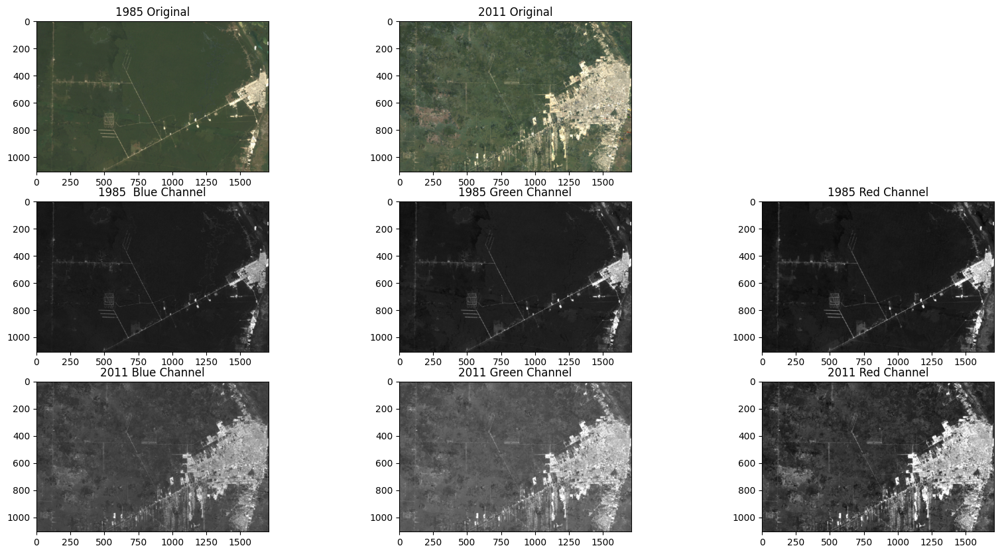

In [5]:
plt.figure(figsize=(20,10))
plt.subplot(331);plt.imshow(image1[:,:,::-1]);plt.title("1985 Original")
plt.subplot(332);plt.imshow(image4[:,:,::-1]);plt.title("2011 Original")
plt.subplot(334);plt.imshow(b1,cmap='gray');plt.title("1985  Blue Channel")
plt.subplot(335);plt.imshow(g1,cmap='gray');plt.title("1985 Green Channel")
plt.subplot(336);plt.imshow(r1,cmap='gray');plt.title("1985 Red Channel")

plt.subplot(337);plt.imshow(b4,cmap='gray');plt.title("2011 Blue Channel")
plt.subplot(338);plt.imshow(g4,cmap='gray');plt.title("2011 Green Channel")
plt.subplot(339);plt.imshow(r4,cmap='gray');plt.title("2011 Red Channel")

plt.show()

In [6]:
#Plotting Linear and Logarithmic histograms


def draw_image_histogram_bgr(image,title = '',yscale = 'linear'):
    "Utility to plot bgr histograms for all color channels independently"
    hist_b = cv2.calcHist([image],[0],None,[256],[0,255])
    hist_g = cv2.calcHist([image],[1],None,[256],[0,255])
    hist_r = cv2.calcHist([image],[2],None,[256],[0,255])

    fig = plt.figure(figsize=(17,5))
    fig.suptitle(title)
    ax = fig.add_subplot(1,3,1)
    ax.set_yscale(yscale)
    plt.plot(hist_b,color='b',label='Blue')
    ax.grid()
    ax.legend()

    ax = fig.add_subplot(1,3,2)
    ax.set_yscale(yscale)
    plt.plot(hist_g,color='g',label='Green')
    ax.grid()
    ax.legend()

    ax = fig.add_subplot(1,3,3)
    ax.set_yscale(yscale)
    plt.plot(hist_r,color='r',label='Red')
    ax.grid()
    ax.legend()

    plt.show()



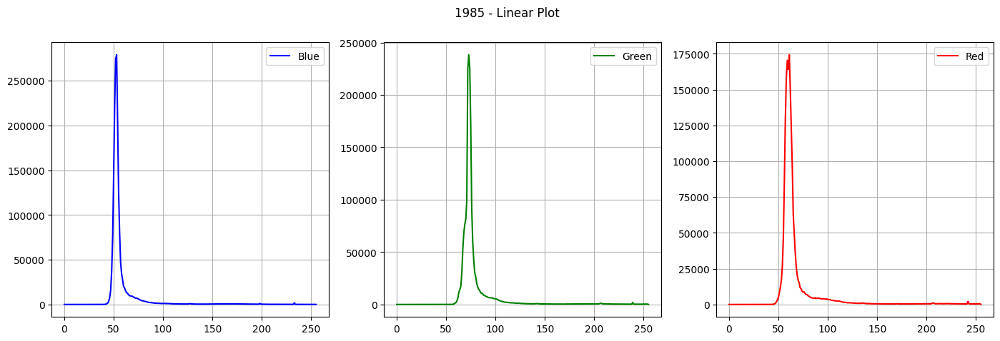

In [7]:
draw_image_histogram_bgr(image1,'1985 - Linear Plot','linear')


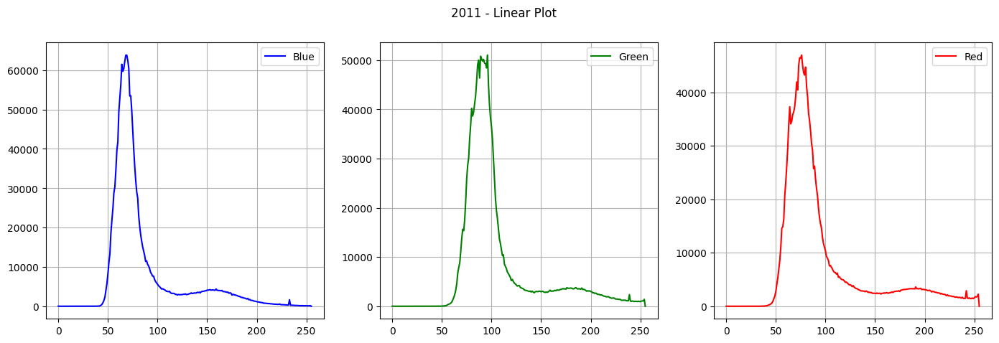

In [8]:
draw_image_histogram_bgr(image4,'2011 - Linear Plot','linear')

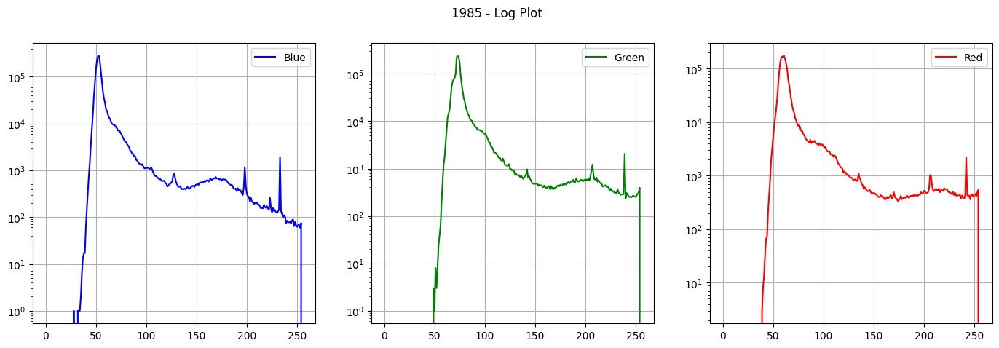

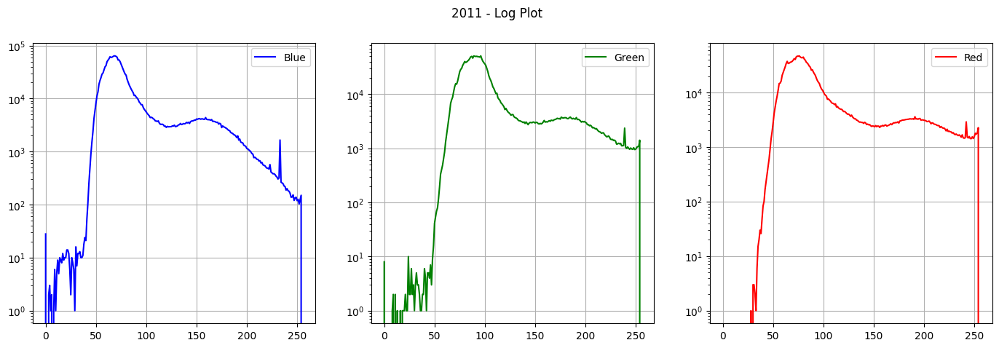

In [9]:
#Displaying Logathimic Graphs
draw_image_histogram_bgr(image1,'1985 - Log Plot','log')
draw_image_histogram_bgr(image4,'2011 - Log Plot','log')

In [10]:
def detect_green_bgr(img):
    lower_BGR_values = np.array([0,50,0],dtype='uint8')
    upper_BGR_values = np.array([255,150,255],dtype='uint8')

    bgr_mask = cv2.inRange(img,lower_BGR_values,upper_BGR_values)

    return bgr_mask

Text(0.5, 1.0, 'Color Segemented in Green Channel')

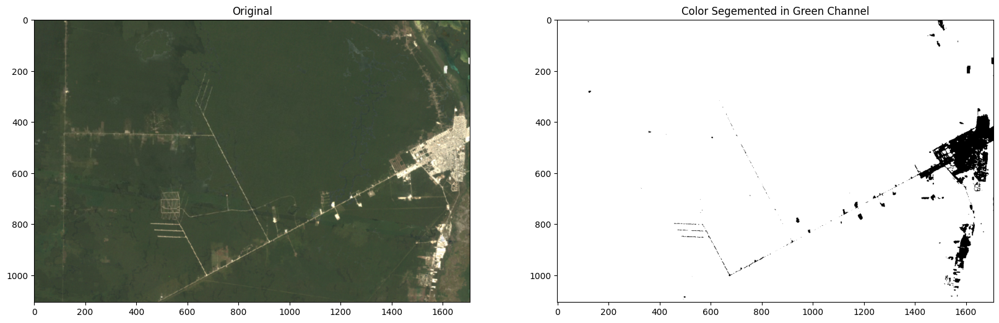

In [11]:
segmented_green = detect_green_bgr(image1)

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(121)
plt.imshow(image1[:,:,::-1])
ax.set_title("Original")

ax = fig.add_subplot(122)
plt.imshow(segmented_green,cmap='gray')
ax.set_title("Color Segemented in Green Channel")


In [12]:
def percent_forest(gray_img):
    '''Returns the percentage of the image detected to be forest'''
    c = cv2.countNonZero(gray_img)
    t = gray_img.shape[0] * gray_img.shape[1]

    return round((c/t)*100,2)

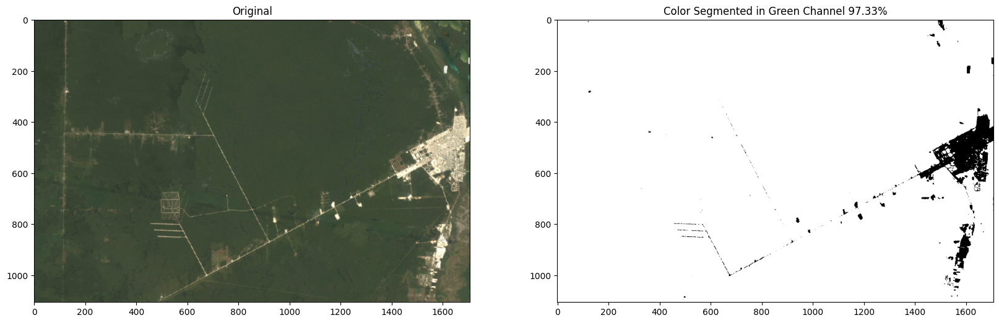

In [13]:
segemented_green = detect_green_bgr(image1)
green_ratio = percent_forest(segemented_green)

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(1,2,1)
plt.imshow(image1[:,:,::-1])
ax.set_title('Original')

ax = fig.add_subplot(1,2,2)
plt.imshow(segemented_green,cmap='gray')
ax.set_title('Color Segmented in Green Channel '+str(green_ratio)+'%')
plt.show()

In [17]:
image_files = glob.glob('..\\Applications\\Images\*.png')

In [18]:
image_files.sort()

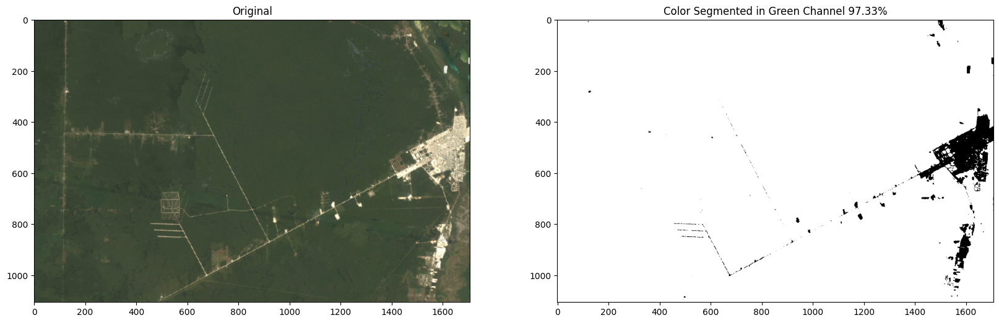

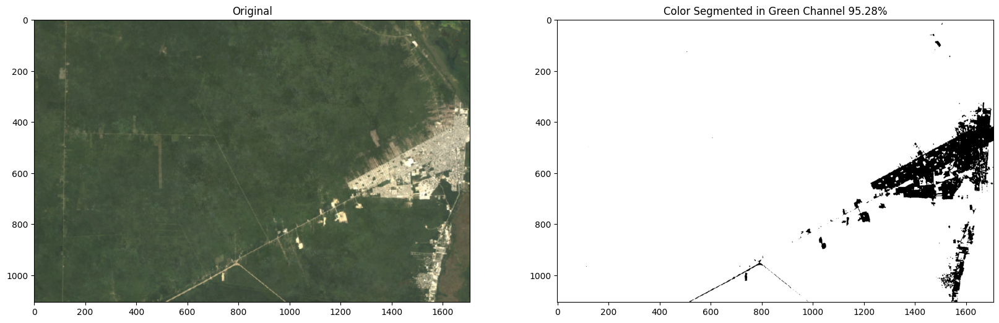

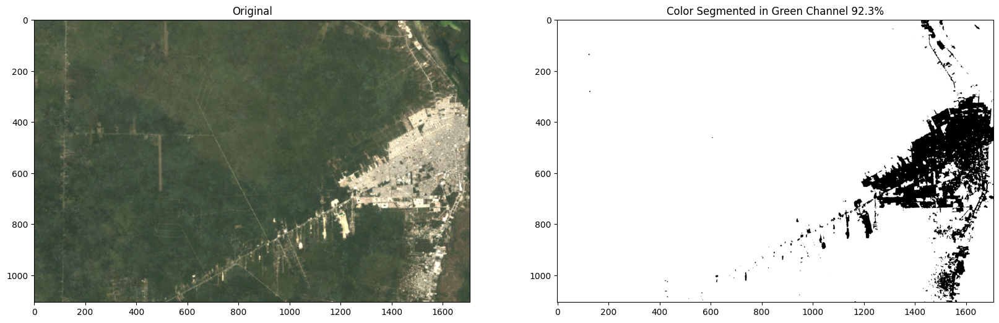

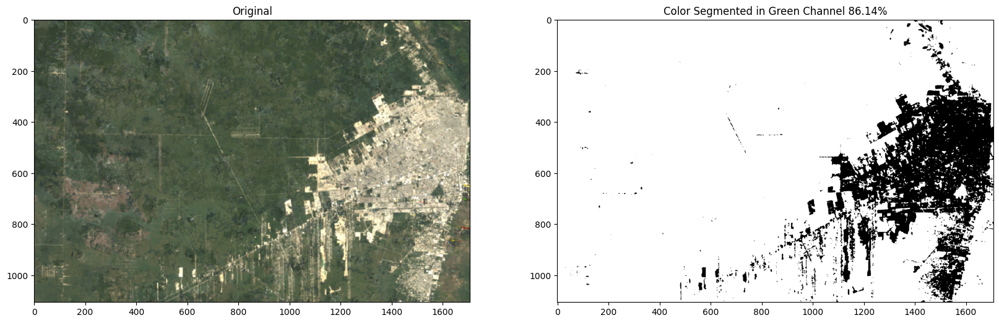

In [19]:
for image_file in image_files:
    image = cv2.imread(image_file)
    segmented_green = detect_green_bgr(image)
    green_percent = percent_forest(segmented_green)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(1,2,1)
    plt.imshow(image[:,:,::-1])
    ax.set_title('Original')
    
    ax = fig.add_subplot(1,2,2)
    plt.imshow(segmented_green,cmap='gray')
    ax.set_title('Color Segmented in Green Channel '+str(green_percent)+'%')
    plt.show()

In [20]:
def draw_image_histogram_hsv(image,title='',yscale=''):
    '''Utility to get the histogram of the image for HSV'''
    hsv_image = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    hist_h = cv2.calcHist([hsv_image],[0],None,[180],[0,179])
    hist_s = cv2.calcHist([hsv_image],[1],None,[256],[0,255])
    hist_v = cv2.calcHist([hsv_image],[2],None,[256],[0,255])

    fig = plt.figure(figsize=(20,10))
    fig.suptitle(title)
    ax = fig.add_subplot(1,3,1)
    ax.set_yscale(yscale)
    plt.plot(hist_h,color='b',label='Hue')
    ax.grid()
    ax.legend()

    ax = fig.add_subplot(1,3,2)
    ax.set_yscale(yscale)
    plt.plot(hist_s,color='g',label='Saturation')
    ax.grid()
    ax.legend()

    ax = fig.add_subplot(1,3,3)
    ax.set_yscale(yscale)
    plt.plot(hist_v,color='r',label='Value')
    ax.grid()
    ax.legend()

    plt.show()
    
    

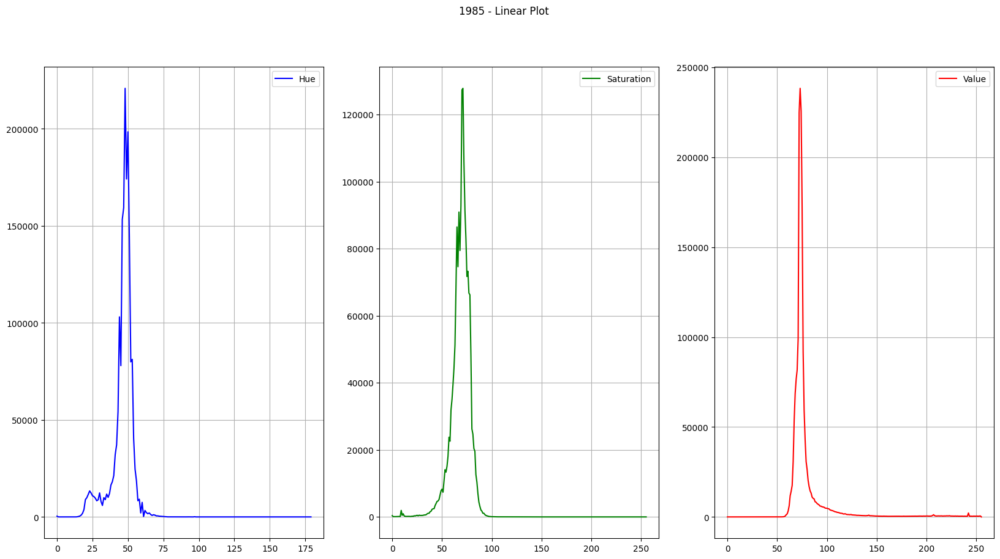

In [21]:
draw_image_histogram_hsv(image1,'1985 - Linear Plot','linear')

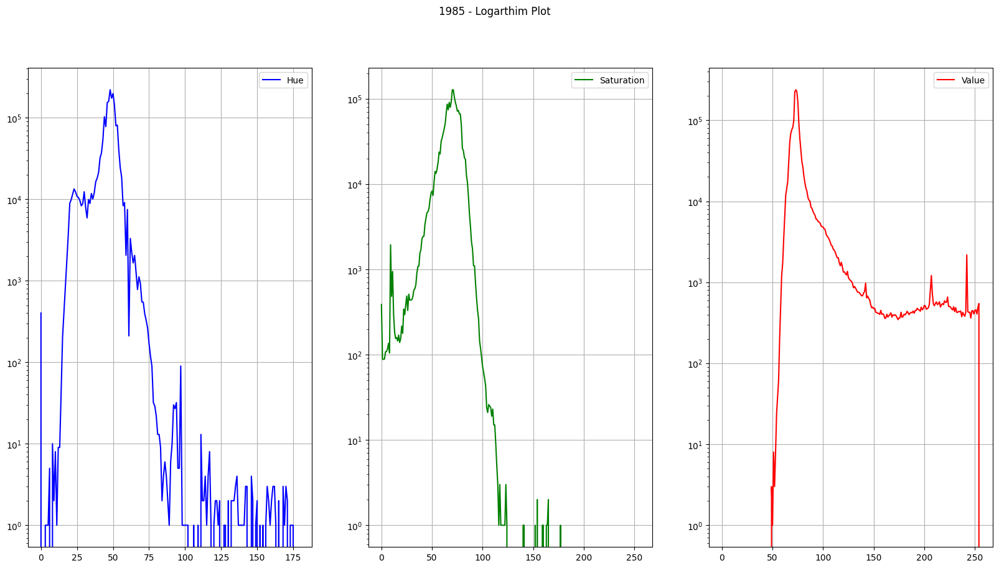

In [22]:
draw_image_histogram_hsv(image1,'1985 - Logarthim Plot','log')

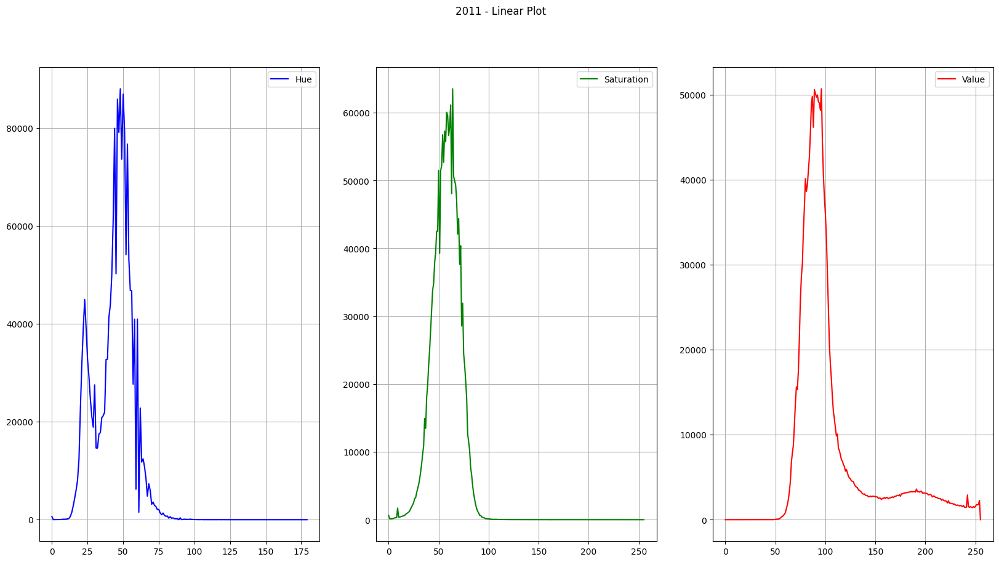

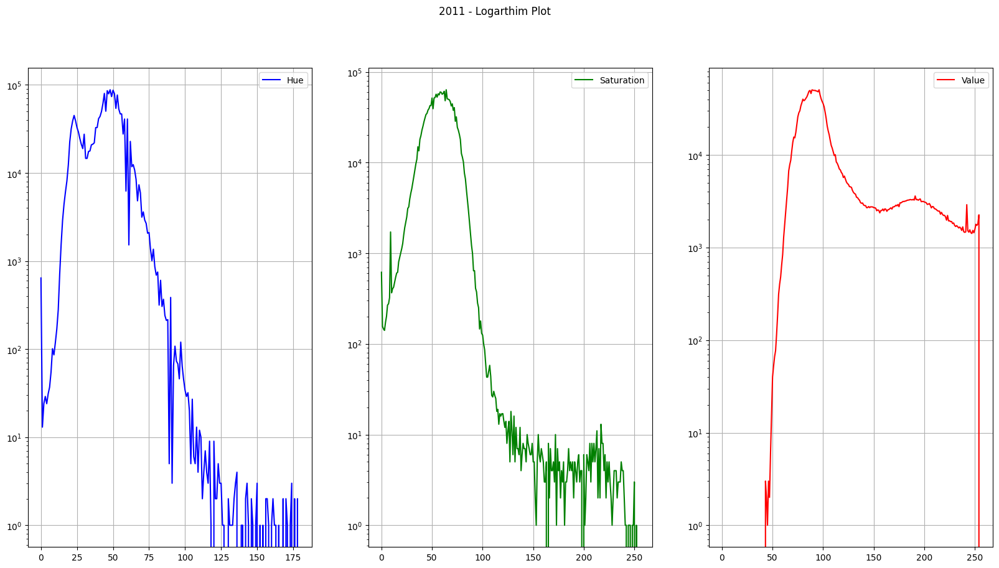

In [24]:
draw_image_histogram_hsv(image4,'2011 - Linear Plot','linear')
draw_image_histogram_hsv(image4,'2011 - Logarthim Plot','log')

In [25]:
def detect_green_hsv(img):
    "Detect and Return a mask for the greenn area of an image"
    HSV_image = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    lower_HSV_value = np.array([36,0,50],dtype='uint8')
    higher_HSV_value = np.array([86,250,100],dtype='uint8')
    mask_hsv = cv2.inRange(HSV_image,lower_HSV_value,higher_HSV_value)
    return mask_hsv

In [26]:
image_files = glob.glob("..\\Applications\\Images\\*.png")

In [27]:
image_files.sort()

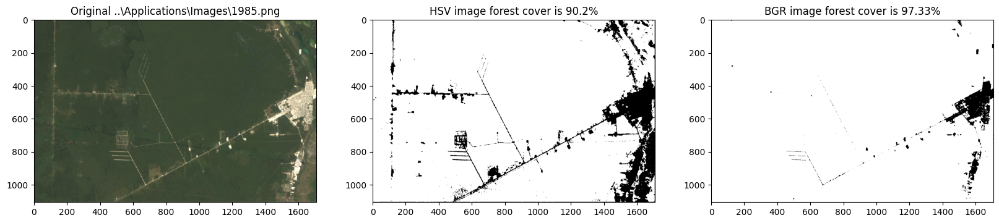

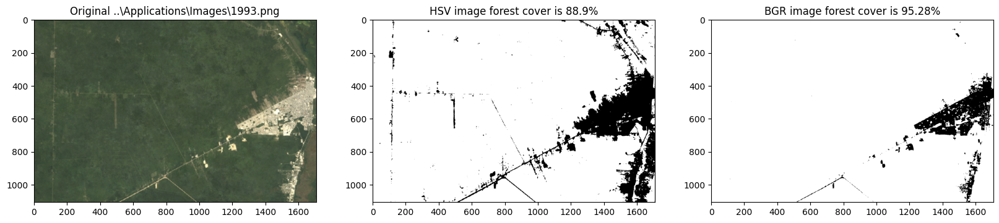

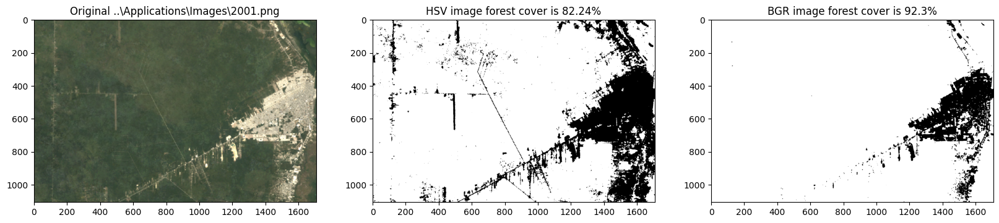

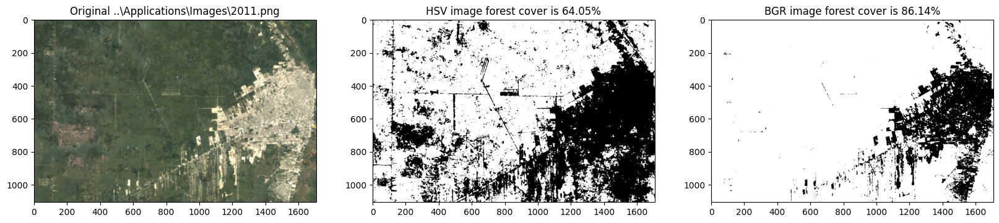

In [29]:
for image_file in image_files:
    img = cv2.imread(image_file)
    segemented_green_hsv = detect_green_hsv(img)
    green_ratio_hsv = percent_forest(segemented_green_hsv)

    segmented_green_bgr = detect_green_bgr(img)
    green_ratio_bgr = percent_forest(segmented_green_bgr)

    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(1,3,1)
    plt.imshow(img[:,:,::-1])
    ax.set_title("Original "+image_file)

    ax = fig.add_subplot(1,3,2)
    plt.imshow(segemented_green_hsv,cmap='gray')
    ax.set_title("HSV image forest cover is "+str(green_ratio_hsv)+'%')

    ax = fig.add_subplot(1,3,3)
    plt.imshow(segmented_green_bgr,cmap='gray')
    ax.set_title("BGR image forest cover is "+str(green_ratio_bgr)+'%')

    plt.show()